In [1]:
#FILTER INPUT IMAGES

In [5]:
%matplotlib inline

In [3]:
#import libraries

In [6]:
from PIL import Image
import numpy as np
from skimage import data
from skimage.morphology import disk
from matplotlib import pyplot as plt
import math

In [5]:
#loading images

In [7]:

im = Image.open('samples/29  ≥π‹ Í⁄√≈.bmp')
im2 = Image.open('samples/30  ≥π‹ ≥›◊¥œﬂ.bmp')
im3 = Image.open('samples/34  ≥π‹÷–…œ.bmp')

npimg1 = np.array(im);
npimg2 = np.array(im2);
npimg3 = np.array(im3);
print(npimg1.shape,npimg2.shape,npimg3.shape);


((1080, 1920, 3), (1080, 1920, 3), (1080, 1920, 3))


In [ ]:
#TEST FROM SCIKIT-IMAGE DATA

(303, 384)


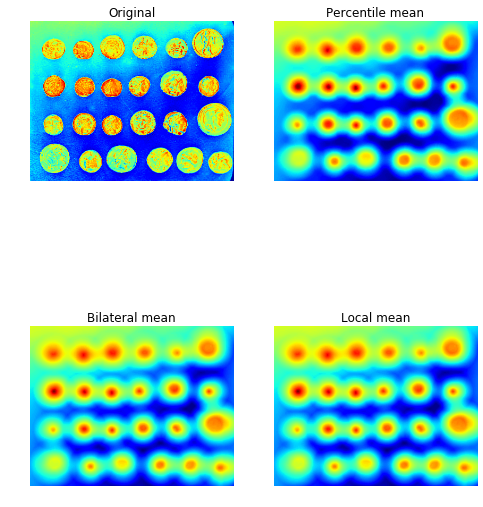

In [8]:
image = data.coins()
selem = disk(20)
print image.shape
percentile_result = rank.mean_percentile(image, selem=selem, p0=.1, p1=.9)
bilateral_result = rank.mean_bilateral(image, selem=selem, s0=500, s1=500)
normal_result = rank.mean(image, selem=selem)


fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10),
                         sharex=True, sharey=True)
ax = axes.ravel()

titles = ['Original', 'Percentile mean', 'Bilateral mean', 'Local mean']
imgs = [image, percentile_result, bilateral_result, normal_result]
for n in range(0, len(imgs)):
    ax[n].imshow(imgs[n])
    ax[n].set_title(titles[n])
    ax[n].set_adjustable('box-forced')
    ax[n].axis('off')

plt.show()

In [ ]:
#ADAPT GRAY SCALE FILTERS TO RGB

In [10]:


from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage import filters


@adapt_rgb(each_channel)
def sobel_each(image):
    return filters.sobel(image)


@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)



In [11]:
from skimage.exposure import rescale_intensity

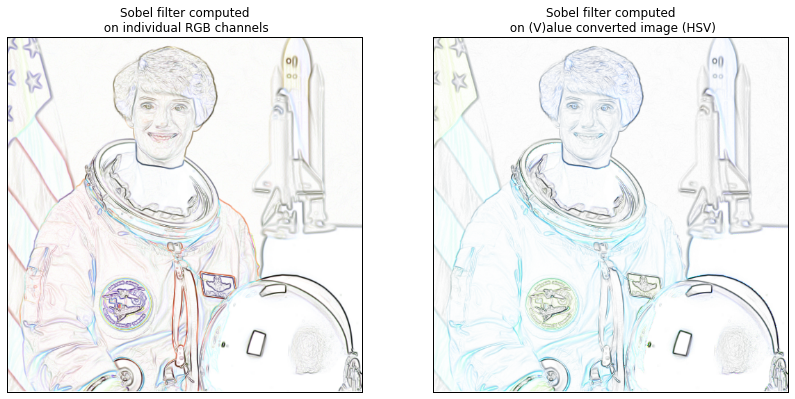

In [12]:

image = data.astronaut()

fig = plt.figure(figsize=(14, 7))
ax_each = fig.add_subplot(121, adjustable='box-forced')
ax_hsv = fig.add_subplot(122, sharex=ax_each, sharey=ax_each,
                         adjustable='box-forced')

# We use 1 - sobel_each(image)
# but this will not work if image is not normalized
ax_each.imshow(rescale_intensity(1 - sobel_each(image)))
ax_each.set_xticks([]), ax_each.set_yticks([])
ax_each.set_title("Sobel filter computed\n on individual RGB channels")

# We use 1 - sobel_hsv(image) but this will not work if image is not normalized
ax_hsv.imshow(rescale_intensity(1 - sobel_hsv(image)))
ax_hsv.set_xticks([]), ax_hsv.set_yticks([])
ax_hsv.set_title("Sobel filter computed\n on (V)alue converted image (HSV)")

In [12]:
#SAMPLE IMAGES

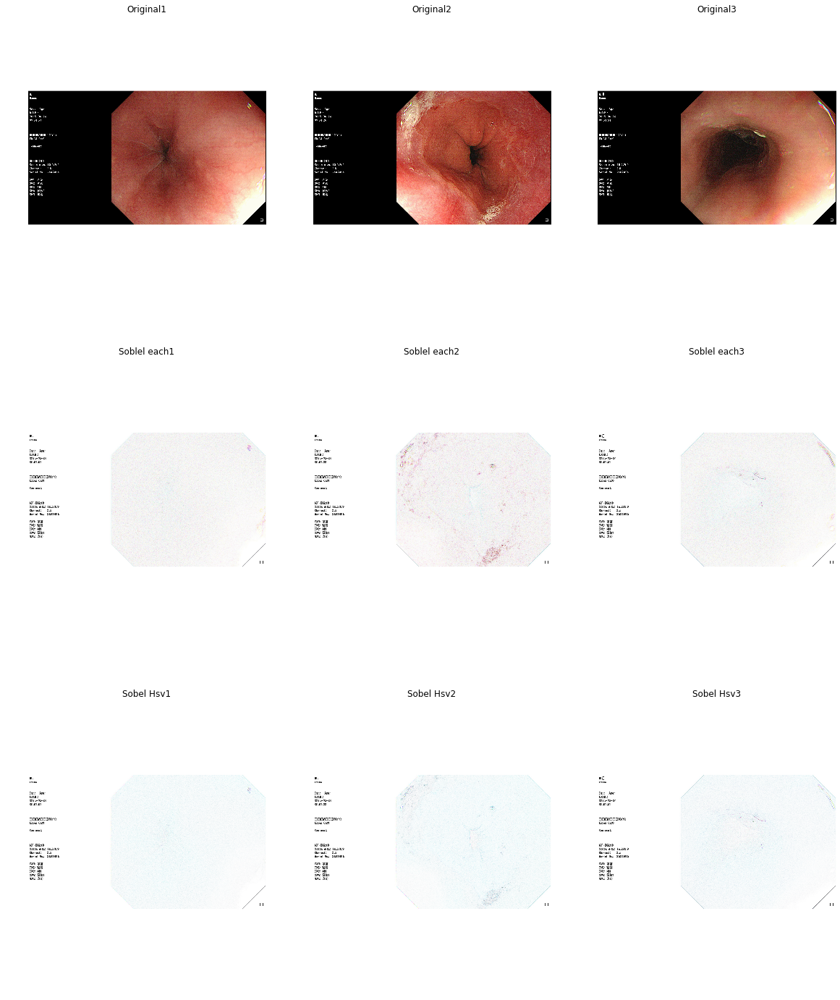

In [14]:
targetImg_titles = ['Original1','Original2','Original3']
srcImg = [npimg1,npimg2,npimg3]
displayImg = [npimg1,npimg2,npimg3]
myFilters = ['mean_percentile','mean_bilateral','mean']
myFilters2 = ['Soblel each','Sobel Hsv']


for m in range(0,3):
    displayImg.append(rescale_intensity(1 - sobel_each(srcImg[m])))
    targetImg_titles.append("Soblel each"+str(m+1))
for m in range(0,3):
    displayImg.append(rescale_intensity(1 - sobel_hsv(srcImg[m])))
    targetImg_titles.append("Sobel Hsv"+str(m+1))

        

numOfCol = len(srcImg)
numOfRow = math.ceil(float(len(displayImg))/float(numOfCol))

                          
fig, axes= plt.subplots(numOfCol, numOfCol, figsize=(20, 8*numOfCol), sharex=True, sharey=True)
ax = axes.ravel()

for rrr in range(int(numOfCol*numOfRow)):
    ax[rrr].imshow(displayImg[rrr],cmap='gray')
    ax[rrr].set_title(targetImg_titles[rrr])
    ax[rrr].axis('off')
    
plt.show()

In [15]:
#OTHER FILTERS

In [17]:
from skimage.exposure import rescale_intensity

In [18]:
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage.filters import rank
from skimage.morphology import disk

selem = disk(20)

@adapt_rgb(each_channel)
def mean_percentile_each(image):
    return rank.mean_percentile(image, selem=selem, p0=.1, p1=.9)

@adapt_rgb(hsv_value)
def mean_percentile_hsv(image):
    return rank.mean_percentile(image, selem=selem, p0=.1, p1=.9)


@adapt_rgb(each_channel)
def mean_bilateral_each(image):
    return rank.mean_bilateral(image, selem=selem, s0=500, s1=500)

@adapt_rgb(hsv_value)
def mean_bilateral_hsv(image):
    return rank.mean_bilateral(image, selem=selem, s0=500, s1=500)


@adapt_rgb(each_channel)
def mean_each(image):
    return rank.mean(image, selem=selem)

@adapt_rgb(hsv_value)
def mean_hsv(image):
    return rank.mean(image, selem=selem)


@adapt_rgb(each_channel)
def median_each(image):
    return rank.median(image, selem=selem)

@adapt_rgb(hsv_value)
def median_hsv(image):
    return rank.median(image, selem=selem)


9


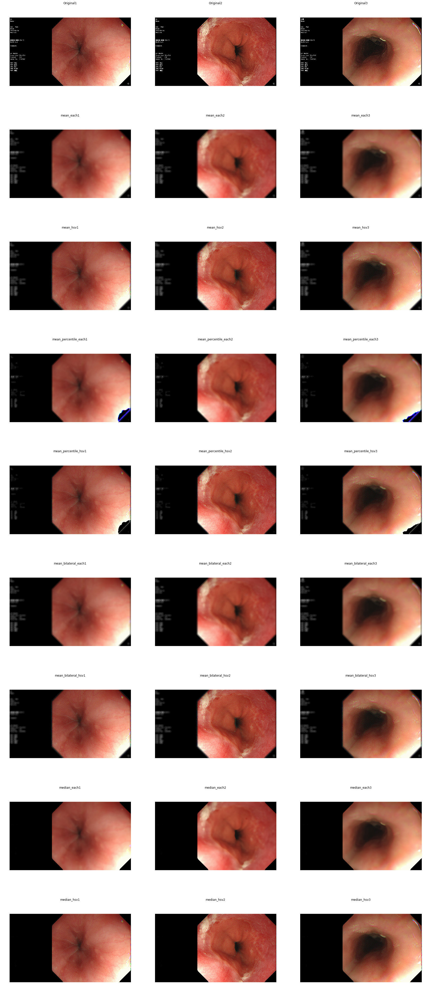

In [21]:
import math 

targetImg_titles = ['Original1','Original2','Original3']
srcImg = [npimg1,npimg2,npimg3]
displayImg = [npimg1,npimg2,npimg3]
myFiltersNames = ['mean_each','mean_hsv','mean_percentile_each',
                  'mean_percentile_hsv','mean_bilateral_each','mean_bilateral_hsv'
                  ,'median_each','median_hsv']
myFilters = [mean_each,mean_hsv,mean_percentile_each,mean_percentile_hsv
             ,mean_bilateral_each,mean_bilateral_hsv,median_each,median_hsv]


#Dynamically prepare data for plotting
for n in range(0,len(myFilters)):
    for m in range(0,len(srcImg)):
        displayImg.append(myFilters[n](srcImg[m]))
        targetImg_titles.append(myFiltersNames[n]+str(m+1))

#Dynamically plotting
mycols = len(srcImg)
myrows = int(math.ceil(float(len(displayImg))/float(mycols)))
print(myrows)
fig, axes= plt.subplots(myrows, mycols, figsize=(30, 8*myrows), sharex=True, sharey=True)
ax = axes.ravel()

for rrr in range(mycols*myrows):
    ax[rrr].imshow(displayImg[rrr],cmap='gray')
    ax[rrr].set_title(targetImg_titles[rrr])
    ax[rrr].axis('off')
    
plt.show()




In [48]:
#above example with scaled intensity

In [49]:
from skimage.exposure import rescale_intensity

9


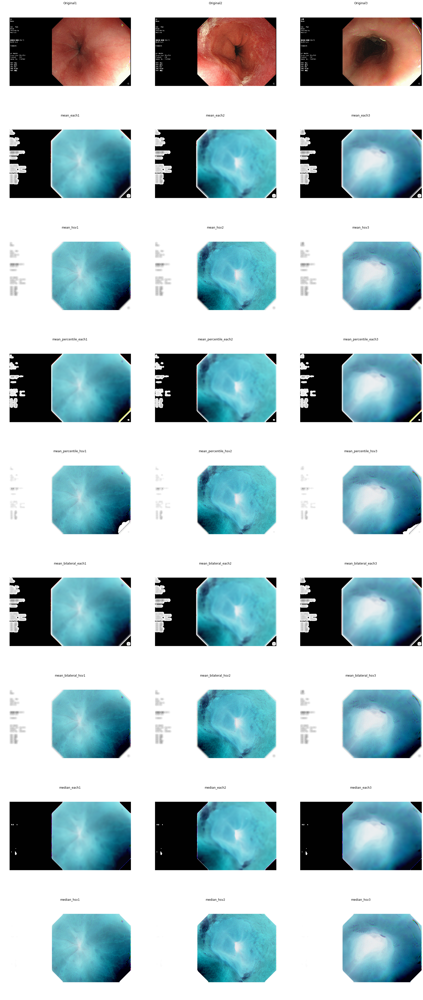

In [20]:
import math 

targetImg_titles = ['Original1','Original2','Original3']
srcImg = [npimg1,npimg2,npimg3]
displayImg = [npimg1,npimg2,npimg3]
myFiltersNames = ['mean_each','mean_hsv','mean_percentile_each',
                  'mean_percentile_hsv','mean_bilateral_each','mean_bilateral_hsv'
                  ,'median_each','median_hsv']
myFilters = [mean_each,mean_hsv,mean_percentile_each,mean_percentile_hsv
             ,mean_bilateral_each,mean_bilateral_hsv,median_each,median_hsv]

#Dynamically prepare data for plotting
for n in range(0,len(myFilters)):
    for m in range(0,len(srcImg)):
        displayImg.append(rescale_intensity(1-myFilters[n](srcImg[m])))
        targetImg_titles.append(myFiltersNames[n]+str(m+1))

        
#Dynamically plotting        
mycols = len(srcImg)
myrows = int(math.ceil(float(len(displayImg))/float(mycols)))
print(myrows)
fig, axes= plt.subplots(myrows, mycols, figsize=(30, 8*myrows), sharex=True, sharey=True)
ax = axes.ravel()

for rrr in range(mycols*myrows):
    ax[rrr].imshow(displayImg[rrr],cmap='gray')
    ax[rrr].set_title(targetImg_titles[rrr])
    ax[rrr].axis('off')
    
plt.show()